Imaginemos que trabajamos en una empresa de e-commerce que busca optimizar sus estrategias de marketing y fidelización. Al identificar patrones en los datos de clientes que llevan a realizar o no realizar una compra, podremos:

Personalizar las ofertas para los clientes potenciales.
Mejorar la experiencia de compra al enfocarnos en los factores clave que influyen en su decisión.
Maximizar los ingresos al reducir la inversión en clientes con baja probabilidad de compra.

El objetivo será predecir la probabilidad de que un cliente realice una compra (PurchaseStatus) basándonos en sus características demográficas, comportamiento de compra y otras variables relevantes. Esto incluye analizar cómo factores como la edad, el ingreso anual, la cantidad de compras anteriores, la participación en programas de lealtad, y el tiempo que pasan en el sitio web influyen en su decisión de compra.
| Columna              | Descripción                                                                 |
|-----------------------|-----------------------------------------------------------------------------|
| Age                  | Edad del cliente.                                                          |
| Gender               | Género del cliente.                                                        |
| AnnualIncome         | Ingreso anual del cliente.                                                 |
| NumberOfPurchases    | Número de compras realizadas por el cliente.                               |
| ProductCategory      | Categoría del producto comprado (por ejemplo, Sports, Electronics, Clothing, etc.). |
| TimeSpentOnWebsite   | Tiempo que el cliente pasó en el sitio web (en minutos).                   |
| LoyaltyProgram       | Indica si el cliente es parte de un programa de lealtad (Yes/No).          |
| DiscountsAvailed     | Número de descuentos aprovechados por el cliente.                          |
| PurchaseStatus       | Indica si el cliente completó la compra (Yes/No).                          |

In [53]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\DELL\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [54]:
# Tratamiento de datos
# -----------------------------------------------------------------------
import numpy as np
import pandas as pd
from itertools import product
from itertools import combinations
from scipy.stats import chi2_contingency
# Otros objetivos
# -----------------------------------------------------------------------
import math

import sys

sys.path.append('../') #pongo los 2 puntos para que salga de la carpeta
import src.soporte_preprocesamiento as sp

# Gráficos
# -----------------------------------------------------------------------
import seaborn as sns
import matplotlib.pyplot as plt


# Para tratar el problema de desbalance
# -----------------------------------------------------------------------
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek

# Outliers
from scipy.stats import zscore # para calcular el z-score
from sklearn.neighbors import LocalOutlierFactor # para detectar outliers usando el método LOF
from sklearn.ensemble import IsolationForest # para detectar outliers usando el metodo IF
from sklearn.neighbors import NearestNeighbors 

In [55]:
df = pd.read_csv('C:\\Users\\DELL\\Git\\Clases\\Semana 9\\datos\\customer_purchase_data.csv', index_col=0)

# Observaciones:

## Datos
- 1500 filas,9 columnas.
## Duplicados
- 112 duplicados.
## Variables
- Variables numéricas y categóricas
- De las categóricas, solo ProductCategory tiene más de dos opciones. 
- NumberOf Purchases: enemos datos desde 0 compras, hasta 20.
## Nulos
- Sin nulos
## Edades
- Tengo edades desde 18 a 70 años
Media y mediana muy similares
## AnnualIncome
- Medias y medianas muy similares
## Demás variables numéricas
- Medias y medianas similares


In [56]:
df.head()

,Age,Gender,AnnualIncome,NumberOfPurchases,ProductCategory,TimeSpentOnWebsite,LoyaltyProgram,DiscountsAvailed,PurchaseStatus
0,40,Female,66120.267939,8,Electronics,30.568601,No,5,Yes
1,20,Female,23579.773583,4,Home Goods,38.240097,No,5,No
2,27,Female,127821.306432,11,Home Goods,31.633212,Yes,0,Yes
3,24,Female,137798.623120,19,Beauty,46.167059,No,4,Yes
4,31,Female,99300.964220,19,Clothing,19.823592,No,0,Yes


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1500 entries, 0 to 1499
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 1500 non-null   int64  
 1   Gender              1500 non-null   object 
 2   AnnualIncome        1500 non-null   float64
 3   NumberOfPurchases   1500 non-null   int64  
 4   ProductCategory     1500 non-null   object 
 5   TimeSpentOnWebsite  1500 non-null   float64
 6   LoyaltyProgram      1500 non-null   object 
 7   DiscountsAvailed    1500 non-null   int64  
 8   PurchaseStatus      1500 non-null   object 
dtypes: float64(2), int64(3), object(4)
memory usage: 117.2+ KB


In [58]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1500.0,44.298667,15.537259,18.000000,31.000000,45.000000,57.000000,70.000000
AnnualIncome,1500.0,84249.164338,37629.493078,20001.512518,53028.979155,83699.581476,117167.772858,149785.176481
NumberOfPurchases,1500.0,10.420000,5.887391,0.000000,5.000000,11.000000,15.000000,20.000000
TimeSpentOnWebsite,1500.0,30.469040,16.984392,1.037023,16.156700,30.939516,44.369863,59.991105
DiscountsAvailed,1500.0,2.555333,1.705152,0.000000,1.000000,3.000000,4.000000,5.000000


In [59]:
df.describe(include='O')

,Gender,ProductCategory,LoyaltyProgram,PurchaseStatus
count,1500,1500,1500,1500
unique,2,5,2,2
top,Female,Clothing,No,No
freq,757,331,1010,852


In [60]:
sp.exploracion_dataframe(df,'PurchaseStatus')

El número de datos es 1500 y el de columnas es 9

 ..................... 

Los duplicados que tenemos en el conjunto de datos son: 112

 ..................... 

Los nulos que tenemos en el conjunto de datos son:


,%_nulos



 ..................... 

Los tipos de las columnas son:


,tipo_dato
Age,int64
Gender,object
AnnualIncome,float64
NumberOfPurchases,int64
ProductCategory,object
TimeSpentOnWebsite,float64
LoyaltyProgram,object
DiscountsAvailed,int64
PurchaseStatus,object



 ..................... 

Los valores que tenemos para las columnas categóricas son: 
La columna Gender tiene las siguientes valore únicos:


,count
Gender,
Female,757
Male,743


La columna ProductCategory tiene las siguientes valore únicos:


,count
ProductCategory,
Clothing,331
Sports,321
Electronics,289
Beauty,286
Home Goods,273


La columna LoyaltyProgram tiene las siguientes valore únicos:


,count
LoyaltyProgram,
No,1010
Yes,490


La columna PurchaseStatus tiene las siguientes valore únicos:


,count
PurchaseStatus,
No,852
Yes,648


In [61]:
df.duplicated().sum()

112

In [62]:
df[df.duplicated()]

,Age,Gender,AnnualIncome,NumberOfPurchases,ProductCategory,TimeSpentOnWebsite,LoyaltyProgram,DiscountsAvailed,PurchaseStatus
243,57,Female,79069.053493,8,Sports,43.221622,No,2,No
271,43,Male,101042.774561,14,Sports,1.596751,No,5,No
299,65,Female,55499.205296,20,Sports,12.778100,No,5,No
304,50,Male,41425.926045,6,Electronics,29.865093,Yes,2,No
306,56,Female,48679.553852,17,Clothing,10.110530,No,3,No
...,...,...,...,...,...,...,...,...,...
1461,67,Female,110466.885362,17,Electronics,43.108669,No,1,No
1484,68,Male,80311.223269,14,Home Goods,19.080098,No,3,No
1485,21,Female,120794.999552,10,Electronics,7.630770,No,2,No
1492,63,Male,71874.591294,10,Home Goods,43.546243,No,1,No


In [63]:
df = df.drop_duplicates()

In [64]:
df.shape

(1388, 9)

In [65]:
df['Gender'].value_counts(normalize=True) * 100

Gender
Female    50.144092
Male      49.855908
Name: proportion, dtype: float64

In [66]:
df['PurchaseStatus'].value_counts(normalize=True) * 100

PurchaseStatus
No     53.314121
Yes    46.685879
Name: proportion, dtype: float64

In [67]:
df_num, df_cat = sp.separar_dataframe(df)

In [68]:
df_num

,Age,AnnualIncome,NumberOfPurchases,TimeSpentOnWebsite,DiscountsAvailed
0,40,66120.267939,8,30.568601,5
1,20,23579.773583,4,38.240097,5
2,27,127821.306432,11,31.633212,0
3,24,137798.623120,19,46.167059,4
4,31,99300.964220,19,19.823592,0
...,...,...,...,...,...
1495,39,65048.141834,13,34.590743,5
1496,67,28775.331069,18,17.625707,1
1497,40,57363.247541,7,12.206033,0
1498,63,134021.775532,16,37.311634,0


In [69]:
df_cat

,Gender,ProductCategory,LoyaltyProgram,PurchaseStatus
0,Female,Electronics,No,Yes
1,Female,Home Goods,No,No
2,Female,Home Goods,Yes,Yes
3,Female,Beauty,No,Yes
4,Female,Clothing,No,Yes
...,...,...,...,...
1495,Female,Electronics,No,Yes
1496,Female,Home Goods,No,Yes
1497,Female,Sports,No,No
1498,Male,Home Goods,Yes,Yes


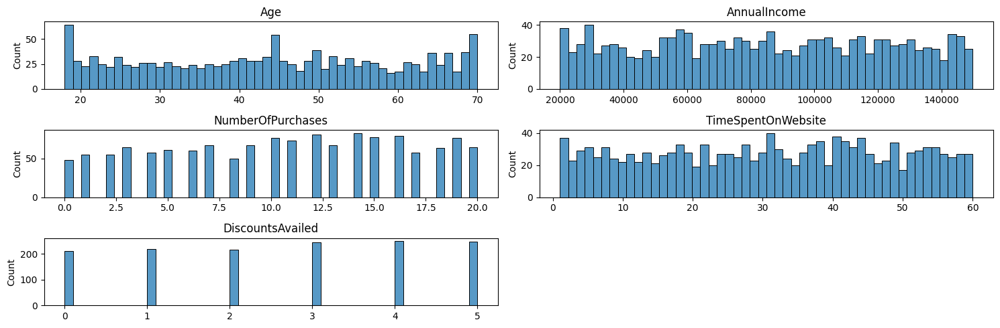

In [70]:
sp.plot_numericas(df_num)

No hay distribuciones normales en mis variables numéricas, por lo que no usaremos métodos paramétricos.

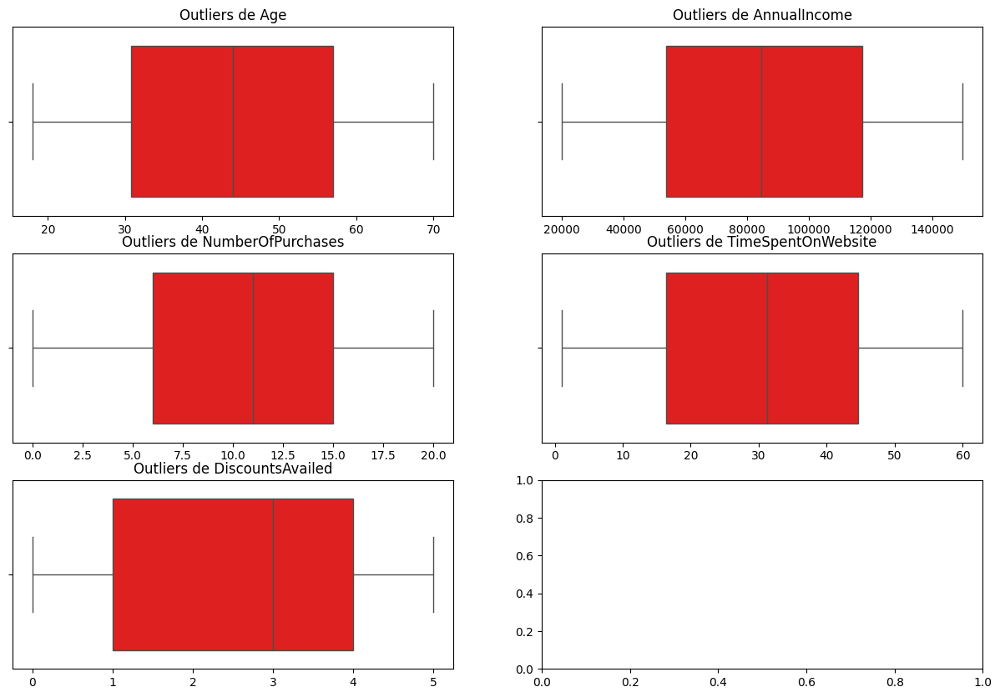

In [71]:
sp.detectar_outliers(df)

En relación a las variables numéricas, no se observan outliers univariados. Como mencioné anteriormente, se observan unas distribuciones interquantilicas bastante buenas.

c:\Users\DELL\Git\Clases\Semana 9\src\soporte_preprocesamiento.py:221: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=columna, data=dataframe, order=dataframe[columna].value_counts().index,
c:\Users\DELL\Git\Clases\Semana 9\src\soporte_preprocesamiento.py:221: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=columna, data=dataframe, order=dataframe[columna].value_counts().index,
c:\Users\DELL\Git\Clases\Semana 9\src\soporte_preprocesamiento.py:221: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=columna, data=dataframe, order=dataframe

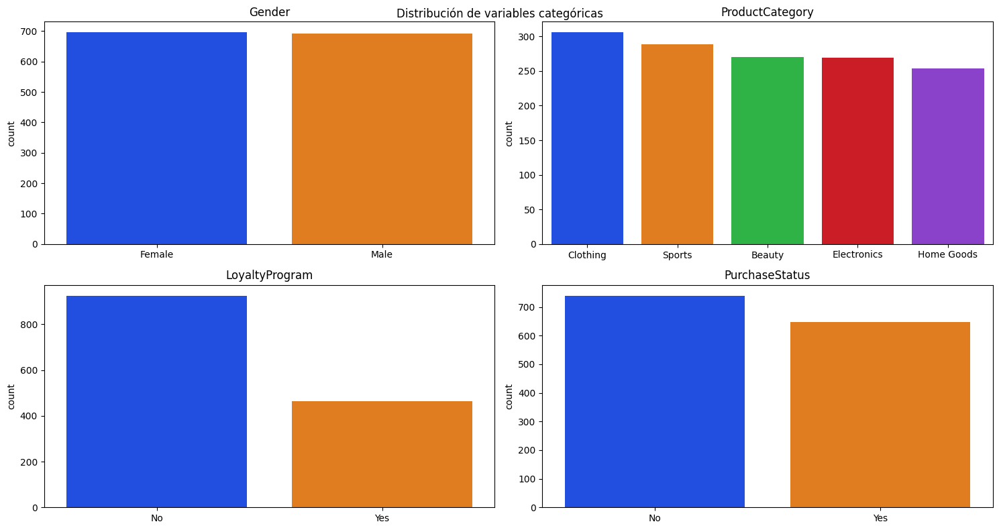

In [72]:
sp.plot_categoricas(df_cat)

Observaciones de mis visualizaciones: 
- No existe una diferencia aparente, univariada, en el género. Pero existe una ligera estadística que está encima para las mujeres.
- Existe una diferencia clara, univariada, en los programas de fidelización. La ausencia de un programa es lo que reina.
- Existen ligeras diferencias entre ProductCategory, univariadas con mayor presencia de Clothing.
- Existen diferencias entre el grupo de compra, dominando un negativo.

En esta gráfica podemos ver la distribución de la presencia de las variables de estas columnas. 

## Correlación

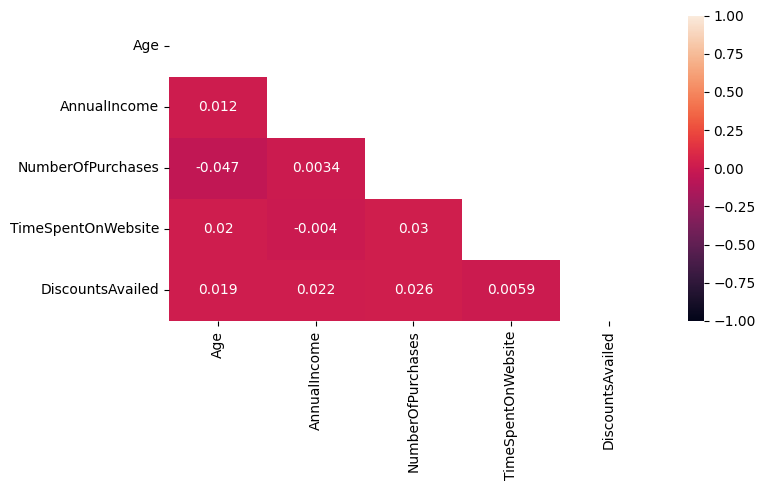

In [73]:
sp.matriz_correacion(df)

No hay correlaciones relevantes entre las variables numéricas

## Visualizaciones, relaciones categóricas

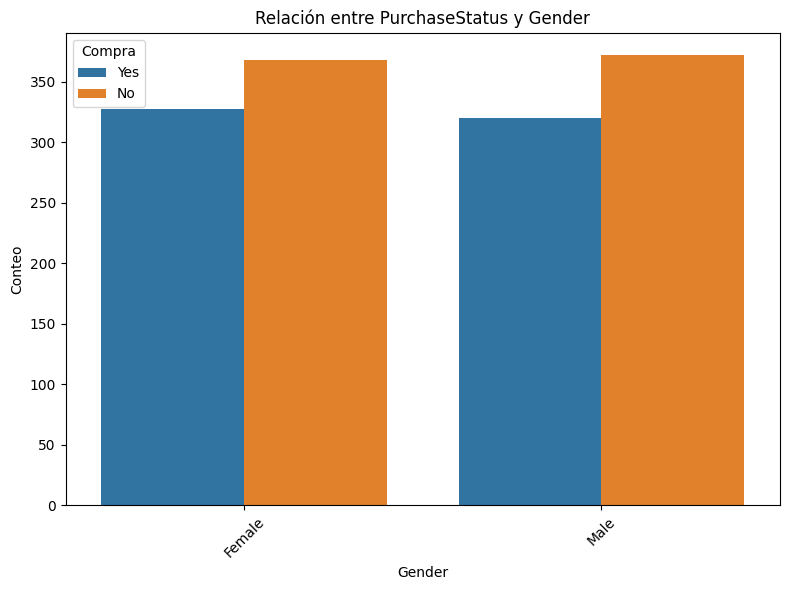

In [74]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Gender', hue='PurchaseStatus')
plt.title('Relación entre PurchaseStatus y Gender')
plt.xlabel('Gender')
plt.ylabel('Conteo')
plt.legend(title='Compra')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

No existen diferencias notables entre el grupo de hombres y mujeres a la hora de comprar o no. Sin embargo, las mujeres tienen mayor presencia a la hora de ejecutar la compra y no hacerlo.

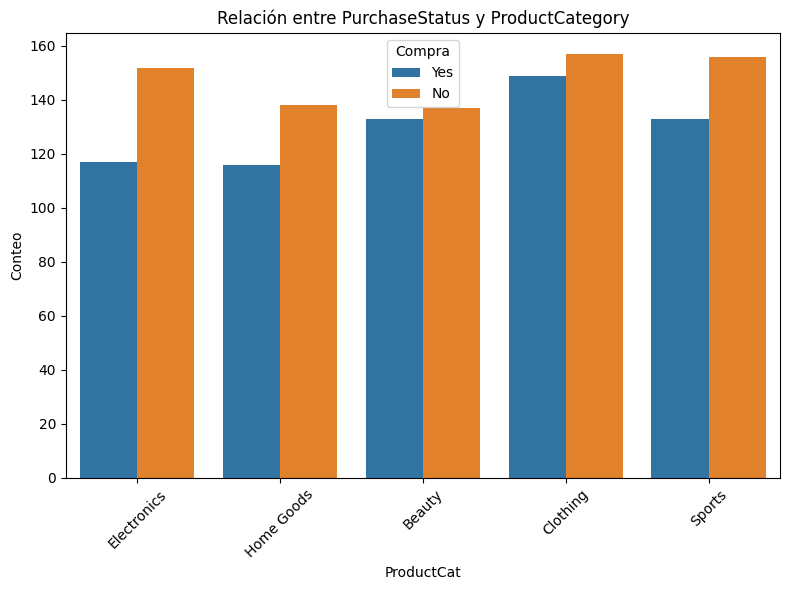

In [75]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='ProductCategory', hue='PurchaseStatus')
plt.title('Relación entre PurchaseStatus y ProductCategory')
plt.xlabel('ProductCat')
plt.ylabel('Conteo')
plt.legend(title='Compra')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

La variables Clothing predomina en términos del grupo compra, sin embargo también tiene una presencia alta a la hora de no comprar porque queda después de sports.

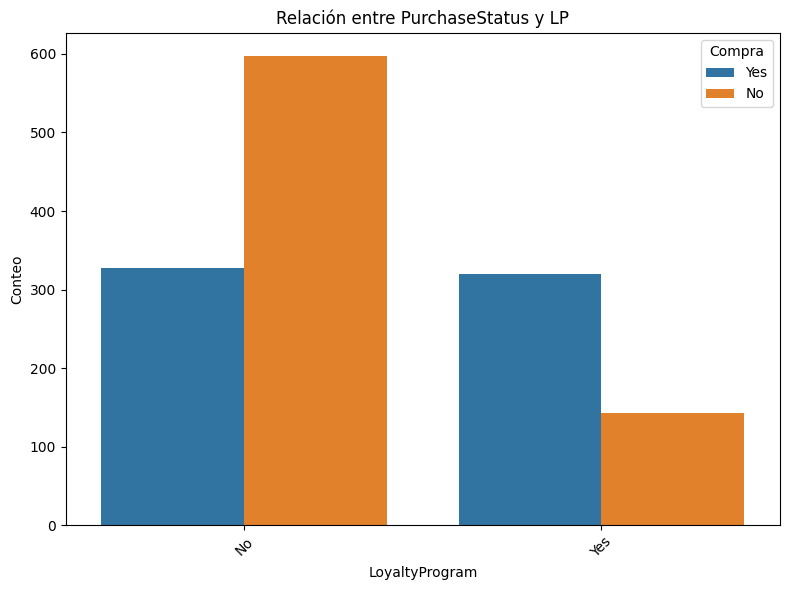

In [76]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='LoyaltyProgram', hue='PurchaseStatus')
plt.title('Relación entre PurchaseStatus y LP')
plt.ylabel('Conteo')
plt.legend(title='Compra')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Puedo buscar la diferencia de proporción, y luego hacer un ordinal.

No se ve una influencia importante para hacer compra por parte del grupo que sí tiene un programa de fidelización porque queda por debajo del que no lo tiene. Así mismo, tiene poca presencia en aquellos que pasan por la web y tampoco compran.

## Relaciones numéricas

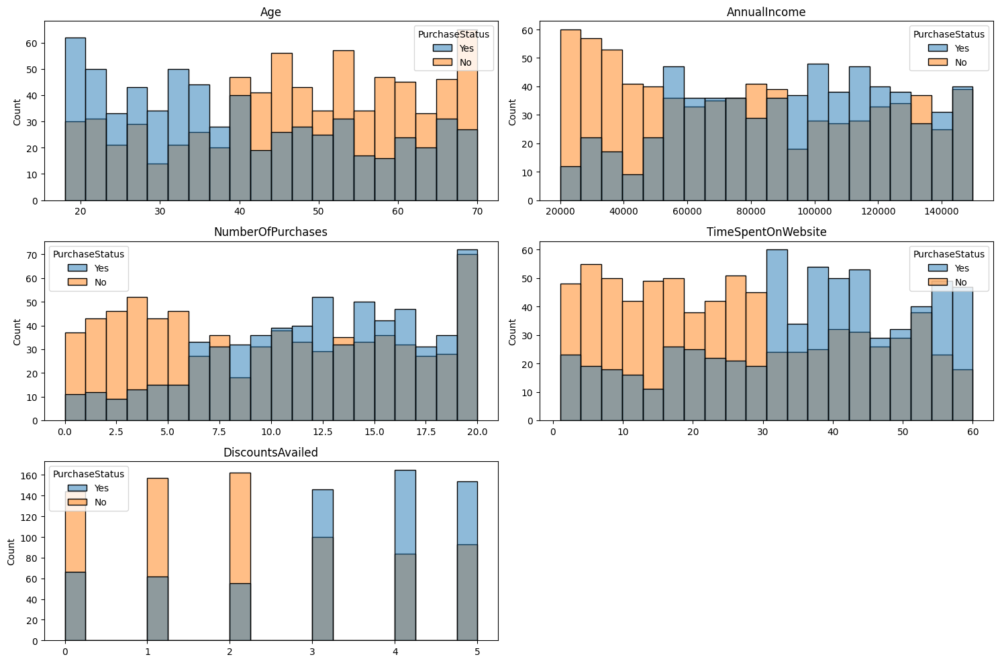

In [78]:
sp.relacion_vr_numericas_problema_categorico(df,'PurchaseStatus')

<Axes: xlabel='Age', ylabel='TimeSpentOnWebsite'>

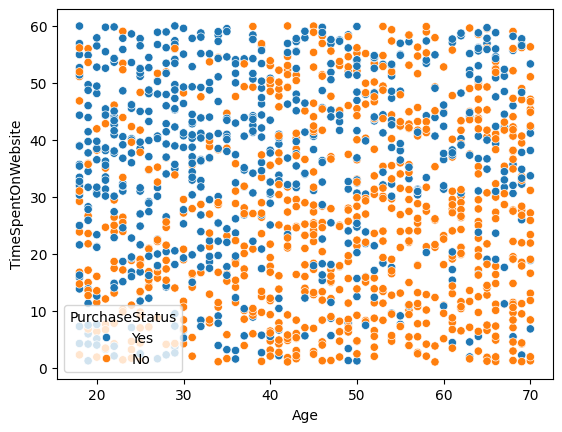

In [79]:
sns.scatterplot(x='Age', y='TimeSpentOnWebsite', hue='PurchaseStatus', data=df)

Al igual que vi en mi matriz de correlación, no existe una correlación significante entre la edad y el tiempo en la web a la hora de comprar o no.

<Axes: xlabel='TimeSpentOnWebsite', ylabel='NumberOfPurchases'>

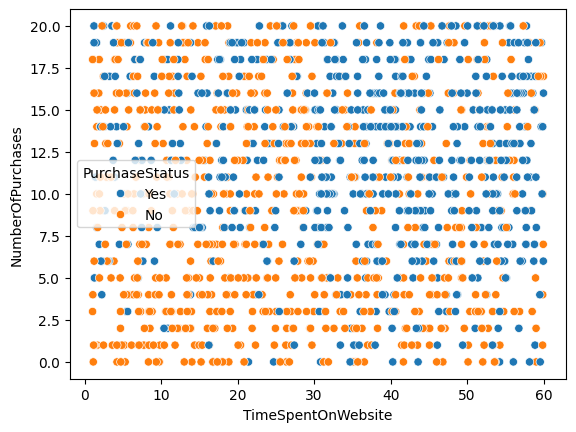

In [80]:
sns.scatterplot(x='TimeSpentOnWebsite', y='NumberOfPurchases', hue='PurchaseStatus', data=df)

Tampoco se puede visualizar ninguna relación positiva y negativa, no queda nada claro.

### Mapeo de la variable PurchaseStatus

In [81]:
df['PurchaseStatus'].unique()

array(['Yes', 'No'], dtype=object)

## Isolation Forest

In [82]:
contaminacion = [0.01, 0.05, 0.1]
estimadores = [10, 100, 150]

combinaciones = list(product(contaminacion, estimadores))
combinaciones

[(0.01, 10),
 (0.01, 100),
 (0.01, 150),
 (0.05, 10),
 (0.05, 100),
 (0.05, 150),
 (0.1, 10),
 (0.1, 100),
 (0.1, 150)]

In [83]:
for cont, esti in combinaciones:
    ifo = IsolationForest(random_state=42, #semilla de datos aleatorios
                        n_estimators=esti, #numero de arboles
                        contamination=cont,
                        n_jobs=-1) #nucleos del ordenador

    df[f'outliers_ifo_{cont}_{esti}'] = ifo.fit_predict(df[['Age', 'AnnualIncome', 'NumberOfPurchases', 'TimeSpentOnWebsite', 'DiscountsAvailed']])

In [84]:
df.head()

,Age,Gender,AnnualIncome,NumberOfPurchases,ProductCategory,TimeSpentOnWebsite,LoyaltyProgram,DiscountsAvailed,PurchaseStatus,outliers_ifo_0.01_10,outliers_ifo_0.01_100,outliers_ifo_0.01_150,outliers_ifo_0.05_10,outliers_ifo_0.05_100,outliers_ifo_0.05_150,outliers_ifo_0.1_10,outliers_ifo_0.1_100,outliers_ifo_0.1_150
0,40,Female,66120.267939,8,Electronics,30.568601,No,5,Yes,1,1,1,1,1,1,1,1,1
1,20,Female,23579.773583,4,Home Goods,38.240097,No,5,No,1,1,1,1,-1,-1,-1,-1,-1
2,27,Female,127821.306432,11,Home Goods,31.633212,Yes,0,Yes,1,1,1,1,1,1,1,1,1
3,24,Female,137798.623120,19,Beauty,46.167059,No,4,Yes,1,1,1,1,1,1,-1,1,1
4,31,Female,99300.964220,19,Clothing,19.823592,No,0,Yes,1,1,1,1,1,1,1,1,1


In [85]:
columnas_hue = df.filter(like='outlier').columns # se queda con todas las columnas de out

In [86]:
columnas_hue

Index(['outliers_ifo_0.01_10', 'outliers_ifo_0.01_100',
       'outliers_ifo_0.01_150', 'outliers_ifo_0.05_10',
       'outliers_ifo_0.05_100', 'outliers_ifo_0.05_150', 'outliers_ifo_0.1_10',
       'outliers_ifo_0.1_100', 'outliers_ifo_0.1_150'],
      dtype='object')

In [87]:
filtered_df = df[(df[columnas_hue] == -1).all(axis=1)]

In [88]:
filtered_df

,Age,Gender,AnnualIncome,NumberOfPurchases,ProductCategory,TimeSpentOnWebsite,LoyaltyProgram,DiscountsAvailed,PurchaseStatus,outliers_ifo_0.01_10,outliers_ifo_0.01_100,outliers_ifo_0.01_150,outliers_ifo_0.05_10,outliers_ifo_0.05_100,outliers_ifo_0.05_150,outliers_ifo_0.1_10,outliers_ifo_0.1_100,outliers_ifo_0.1_150
1293,24,Female,149332.621232,8,Home Goods,1.703161,No,0,No,-1,-1,-1,-1,-1,-1,-1,-1,-1
1489,19,Male,26090.748109,0,Home Goods,53.587522,No,4,No,-1,-1,-1,-1,-1,-1,-1,-1,-1
1490,18,Female,83126.660956,20,Beauty,2.280306,No,1,No,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [89]:
fragmento = 0.6 * len(columnas_hue)
df_fragmento_60 = df[df[columnas_hue].eq(-1).sum(axis=1) >= fragmento]

In [90]:
df_fragmento_60

,Age,Gender,AnnualIncome,NumberOfPurchases,ProductCategory,TimeSpentOnWebsite,LoyaltyProgram,DiscountsAvailed,PurchaseStatus,outliers_ifo_0.01_10,outliers_ifo_0.01_100,outliers_ifo_0.01_150,outliers_ifo_0.05_10,outliers_ifo_0.05_100,outliers_ifo_0.05_150,outliers_ifo_0.1_10,outliers_ifo_0.1_100,outliers_ifo_0.1_150
108,18,Female,26716.933816,6,Beauty,29.218736,No,0,No,-1,1,1,-1,-1,1,-1,-1,-1
125,68,Female,30007.330718,19,Beauty,9.673882,Yes,5,No,1,-1,-1,1,-1,-1,-1,-1,-1
126,19,Female,24590.476142,1,Beauty,14.971058,No,5,No,1,-1,-1,-1,-1,-1,-1,-1,-1
135,18,Female,34941.289618,4,Clothing,51.118401,No,1,No,-1,1,1,-1,-1,1,-1,-1,-1
201,66,Female,141127.983526,0,Clothing,1.128864,No,3,No,1,-1,1,-1,-1,-1,-1,-1,-1
230,18,Female,61002.896447,0,Home Goods,46.836731,No,1,No,-1,-1,1,-1,-1,-1,-1,-1,-1
231,27,Male,106996.034182,1,Sports,58.884760,No,5,Yes,1,1,-1,-1,-1,-1,-1,-1,-1
239,18,Female,118931.030054,1,Home Goods,33.431392,Yes,0,Yes,1,1,-1,-1,-1,-1,-1,-1,-1
270,68,Male,136365.306292,6,Home Goods,2.947704,No,0,No,1,1,1,-1,-1,-1,-1,-1,-1
328,46,Male,50866.350889,19,Electronics,59.741525,Yes,0,Yes,1,1,1,-1,-1,-1,-1,-1,-1


In [91]:
# combinaciones_viz = list(combinations(['Age', 'AnnualIncome', 'NumberOfPurchases', 'TimeSpentOnWebsite', 'DiscountsAvailed'], 2)) # hago combinaciones de 2
# combinaciones_viz
# for outlier in columnas_hue:
#     fig, axes = plt.subplots(nrows=1, ncols=3, figsize = (15,5))

#     for indice, tupla in enumerate(combinaciones_viz):
#         sns.scatterplot(x=tupla[0],
#                         y=tupla[1], 
#                         ax=axes[indice],
#                         data=df,
#                         style=outlier,
#                         size=2,
#                         hue=outlier, #aqui miro todos mis graficos para ver cual me muestra los mejores OUTL
#                         palette='Set1')
        
#     plt.title(f'{outlier}')

# Mapeo a binaria

In [ ]:
df['PurchaseStatus'] = df['PurchaseStatus'].map({'Yes': 1, 'No': 0})

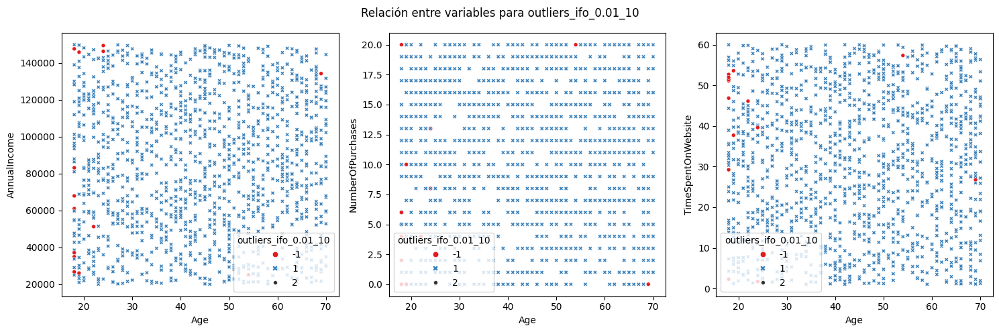

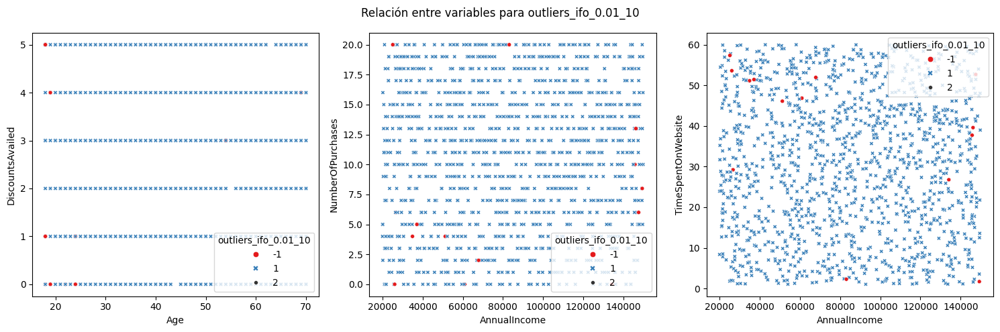

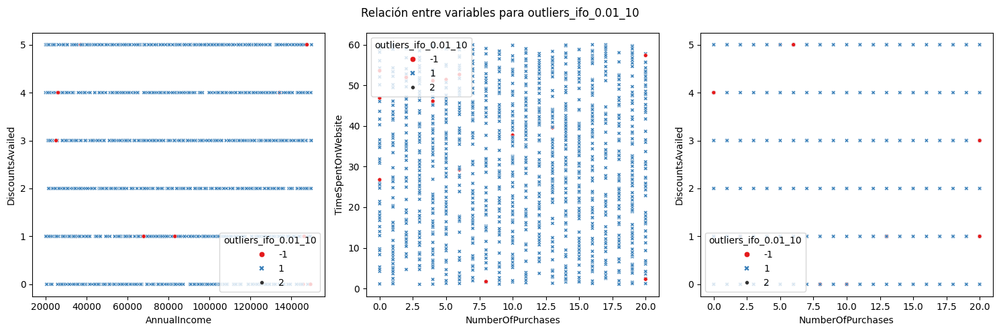

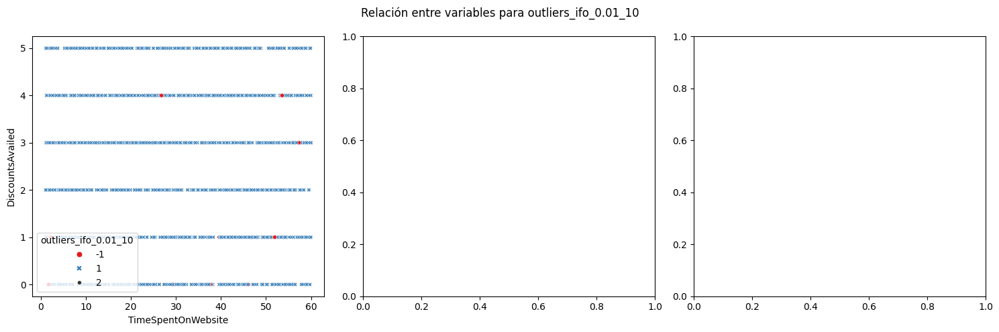

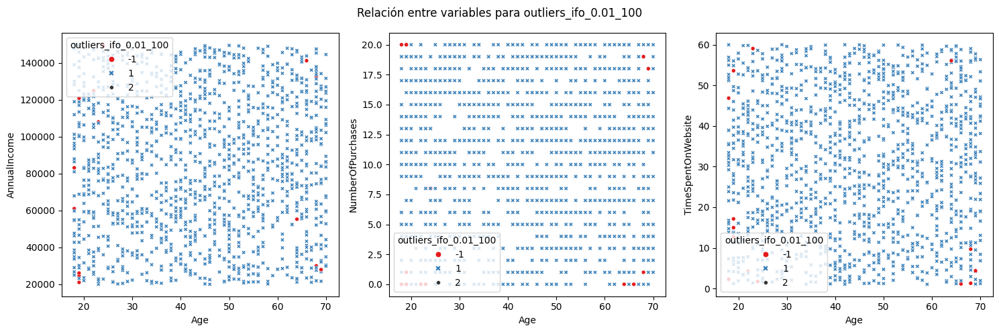

...

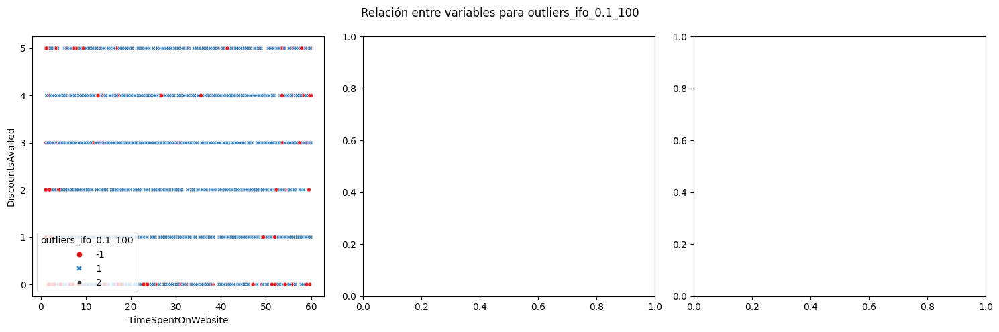

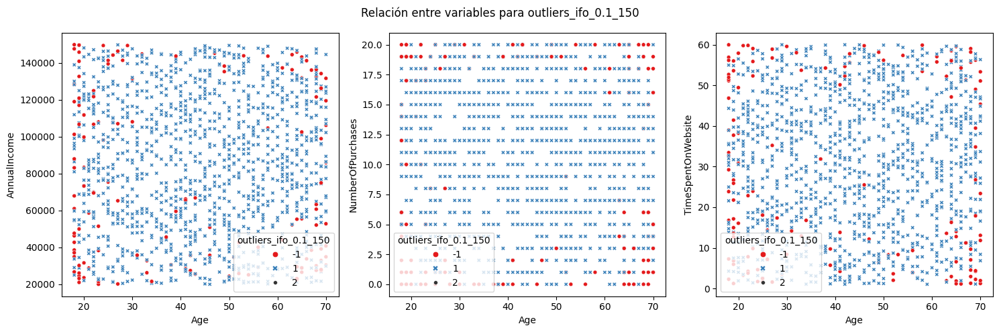

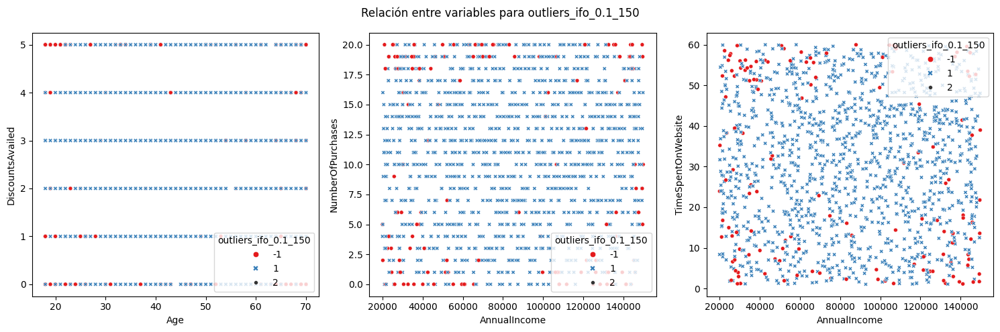

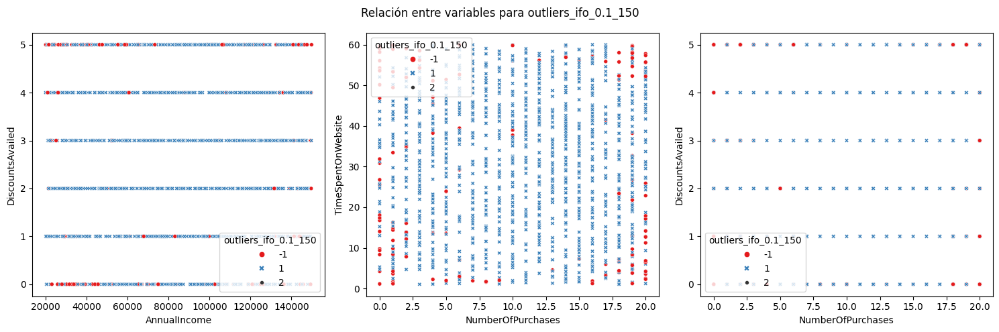

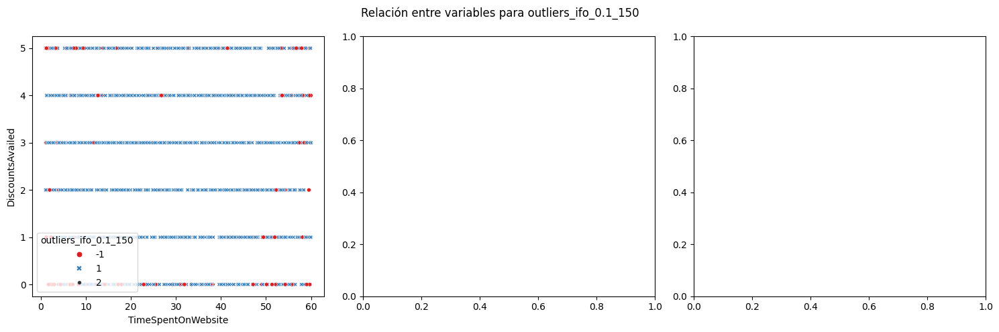

In [93]:
from itertools import combinations
import seaborn as sns
import matplotlib.pyplot as plt

# Generar combinaciones
combinaciones_viz = list(combinations(['Age', 'AnnualIncome', 'NumberOfPurchases', 'TimeSpentOnWebsite', 'DiscountsAvailed'], 2))

# Recorrer las columnas de interés
for outlier in columnas_hue:
    # Dividir las combinaciones en bloques de 3 para ajustarse a los subplots
    for i in range(0, len(combinaciones_viz), 3):
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

        # Seleccionar un bloque de 3 combinaciones
        bloque_combinaciones = combinaciones_viz[i:i+3]

        # Crear los gráficos para cada combinación en el bloque
        for indice, tupla in enumerate(bloque_combinaciones):
            sns.scatterplot(x=tupla[0],
                            y=tupla[1],
                            ax=axes[indice],
                            data=df,
                            style=outlier,
                            size=2,
                            hue=outlier,
                            palette='Set1')
        
        # Ajustar título del conjunto de gráficos
        fig.suptitle(f'Relación entre variables para {outlier}')
        plt.tight_layout()
        plt.show()


## Enconding

### Para chi cuadrado

In [94]:
df_cross_tab_gender = pd.crosstab(df['Gender'], df['PurchaseStatus']) #tabla de contingencia
df_cross_tab_gender

PurchaseStatus,No,Yes
Gender,,
Female,368,328
Male,372,320


In [95]:
chi2, p, dopf, expected = chi2_contingency(df_cross_tab_gender)

In [96]:
df_cross_tab_gender.index

Index(['Female', 'Male'], dtype='object', name='Gender')

In [97]:
pd.DataFrame(expected, columns=df_cross_tab_gender.columns, index=df_cross_tab_gender.index).round()

PurchaseStatus,No,Yes
Gender,,
Female,371.0,325.0
Male,369.0,323.0


In [98]:
expected

array([[371.06628242, 324.93371758],
       [368.93371758, 323.06628242]])

In [99]:
p # no hay relación, por lo que no hay orden

0.7824413702843654

In [100]:
df['DiscountsAvailed'] = df['DiscountsAvailed'].astype('category') # mejor así porque si la dejo en O se la cree como numérica

In [101]:
df.dtypes

Age                         int64
Gender                     object
AnnualIncome              float64
NumberOfPurchases           int64
ProductCategory            object
TimeSpentOnWebsite        float64
LoyaltyProgram             object
DiscountsAvailed         category
PurchaseStatus             object
outliers_ifo_0.01_10        int32
outliers_ifo_0.01_100       int32
outliers_ifo_0.01_150       int32
outliers_ifo_0.05_10        int32
outliers_ifo_0.05_100       int32
outliers_ifo_0.05_150       int32
outliers_ifo_0.1_10         int32
outliers_ifo_0.1_100        int32
outliers_ifo_0.1_150        int32
dtype: object

In [104]:
def detectar_orden_cat(lista_cat, var_respuesta):
    for categorica in lista_cat:
        print(f'Estamos evaluando la variable {categorica.upper()}')
        df_cross_tab = pd.crosstab(df[categorica], df[var_respuesta])
        display(df_cross_tab)

        chi2, p, dof, excepted = chi2_contingency(df_cross_tab) 
        
        if p < 0.05:
            print(f'Sí tiene orden la variable {categorica}')
        else:
            print(f'La variable {categorica} no tiene orden')


In [105]:

detectar_orden_cat(lista_cat=df.select_dtypes(include=['object', 'category']), var_respuesta='PurchaseStatus')

Estamos evaluando la variable GENDER


PurchaseStatus,No,Yes
Gender,,
Female,368,328
Male,372,320


La variable Gender no tiene orden
Estamos evaluando la variable PRODUCTCATEGORY


PurchaseStatus,No,Yes
ProductCategory,,
Beauty,137,133
Clothing,157,149
Electronics,152,117
Home Goods,138,116
Sports,156,133


La variable ProductCategory no tiene orden
Estamos evaluando la variable LOYALTYPROGRAM


PurchaseStatus,No,Yes
LoyaltyProgram,,
No,597,328
Yes,143,320


Sí tiene orden la variable LoyaltyProgram
Estamos evaluando la variable DISCOUNTSAVAILED


PurchaseStatus,No,Yes
DiscountsAvailed,,
0,144,66
1,157,62
2,162,55
3,100,146
4,84,165
5,93,154


Sí tiene orden la variable DiscountsAvailed
Estamos evaluando la variable PURCHASESTATUS


PurchaseStatus,No,Yes
PurchaseStatus,,
No,740,0
Yes,0,648


Sí tiene orden la variable PurchaseStatus


In [103]:
# Le hago un frequency a aquellas que tienen diferencia, las demás un one_hot

In [106]:
df.to_csv('datos/df_pre.csv')

## Desbalanceo